# The Impact of Hurricane Katrina on Business Dynamics in Louisiana

Data obtained from the [US Census Bureau](https://www.census.gov/data/datasets/time-series/econ/bds/bds-datasets.html), processed by Christian Siauwijaya.

Codebook of the Business Dynamics Survey data can be found [Here](https://www2.census.gov/programs-surveys/bds/technical-documentation/data-tables-csv-datasets.pdf).

In [1]:
# Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Importing BDS data
bds = pd.read_csv('bds2020_st_cty.csv')
bds

,year,st,cty,firms,estabs,emp,denom,estabs_entry,estabs_entry_rate,estabs_exit,...,job_destruction_deaths,job_destruction_continuers,job_destruction_rate_deaths,job_destruction_rate,net_job_creation,net_job_creation_rate,reallocation_rate,firmdeath_firms,firmdeath_estabs,firmdeath_emp
0,1978,1,1,397,403,5363,5094,92,23.773,60,...,717,143,14.075,16.883,527,10.346,33.765,40,40,104
1,1978,1,3,1434,1542,14937,14169,312,21.167,176,...,660,1286,4.658,13.734,1460,10.304,27.468,144,145,539
2,1978,1,5,441,466,5451,5116,70,15.201,59,...,154,440,3.010,11.611,646,12.627,23.221,48,48,130
3,1978,1,7,190,193,2617,2555,32,16.368,37,...,104,352,4.070,17.847,127,4.971,35.695,32,32,89
4,1978,1,9,415,426,4072,3926,70,16.847,49,...,210,303,5.350,13.068,291,7.413,26.137,35,35,121
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139659,2020,56,41,469,505,7209,7370,43,8.431,53,...,241,577,3.270,11.099,-318,-4.315,13.569,37,39,185
139660,2020,56,43,283,291,2424,2455,25,8.389,39,...,165,184,6.721,14.216,-42,-1.711,25.010,27,27,87
139661,2020,56,45,189,199,1553,1541,26,13.437,15,...,54,97,3.505,9.802,29,1.883,19.604,10,10,22
139662,2020,56,998,8,8,32,19,5,83.333,(D),...,(D),0,(D),5.405,25,135.135,10.811,(D),(D),(D)


## Data Cleaning

Refering to the [codebook](https://www2.census.gov/programs-surveys/bds/technical-documentation/data-tables-csv-datasets.pdf), *cty* signifies the county geocoding where each number represents a county in the state. Those with code '999' and '998' are classified as 'statewide' and 'unclassified', which are irrelevant for this analysis. One can also notice the cells filled with '(D)' to signify empty data. Moreover, [Historical records](https://www.weather.gov/mob/katrina) show that the Hurricane first made landfall in Louisiana before heading north to Mississipi. Reports show that counties in the Hurricane's path suffer the most damage along with the surrounding coastal counties. Therefore, the Author will take those '999' and '998' county codes out of the dataset, treat the empty data as 0 and restrict the dataset to Louisiana (state code '22', see: [BDS codebook](https://www.census.gov/content/dam/Census/programs-surveys/business-dynamics-statistics/codebook-glossary.pdf)) for the study.



In [2]:
# Drop 998 and 999 cty code
bds = bds[bds.cty != 998]
bds = bds[bds.cty != 999]

# Replace (D) into empty cells
bds = bds.replace('(D)',np.nan)

# Replace all nan value to 0
bds = bds.replace(np.nan, 0)

In [3]:
# List of variables and data types of the BDS data
bds.dtypes

year                            int64
st                              int64
cty                             int64
firms                          object
estabs                         object
emp                            object
denom                          object
estabs_entry                   object
estabs_entry_rate              object
estabs_exit                    object
estabs_exit_rate               object
job_creation                   object
job_creation_births            object
job_creation_continuers        object
job_creation_rate_births       object
job_creation_rate              object
job_destruction                object
job_destruction_deaths         object
job_destruction_continuers     object
job_destruction_rate_deaths    object
job_destruction_rate           object
net_job_creation               object
net_job_creation_rate          object
reallocation_rate              object
firmdeath_firms                object
firmdeath_estabs               object
firmdeath_em

In [4]:
# Display any remaining NaN value in the variable of interest to check for errors
bds[bds['estabs_exit_rate'].isnull()]

,year,st,cty,firms,estabs,emp,denom,estabs_entry,estabs_entry_rate,estabs_exit,...,job_destruction_deaths,job_destruction_continuers,job_destruction_rate_deaths,job_destruction_rate,net_job_creation,net_job_creation_rate,reallocation_rate,firmdeath_firms,firmdeath_estabs,firmdeath_emp


In [5]:
bds[bds['job_destruction_rate'].isnull()]

,year,st,cty,firms,estabs,emp,denom,estabs_entry,estabs_entry_rate,estabs_exit,...,job_destruction_deaths,job_destruction_continuers,job_destruction_rate_deaths,job_destruction_rate,net_job_creation,net_job_creation_rate,reallocation_rate,firmdeath_firms,firmdeath_estabs,firmdeath_emp


The Author is interested in measuring the impact of Hurricane Katrina on business exits and job destruction rate in the counties of Louisiana. As outlined in the introduction, the dataset will be restricted to only include the *estabs_exit_rate* and *job_destruction_rate* along with *year* and *cty* of Louisiana (*cty* == 22).

In [6]:
# Restrict the bds dataset to Louisiana
bds = bds[bds['st'] == 22]

# Pooling the relevant variables to a new dataframe
bdsEstabs = bds[['year','cty', 'estabs_exit_rate', 'job_destruction_rate']]
bdsEstabs.dtypes

year                     int64
cty                      int64
estabs_exit_rate        object
job_destruction_rate    object
dtype: object

Data types of the variables of interest are still classified as objects. One need to convert these variables into floats to accomodate the decimals in *estabs_exit_rate* and *job_destruction_rate* before conducting statistical analysis with the data.

In [7]:
# Convert estabs_exit_rate and job_destruction_rate to float
bdsEstabs = bdsEstabs.astype({'estabs_exit_rate':'float', 'job_destruction_rate':'float'})
bdsEstabs.dtypes

year                      int64
cty                       int64
estabs_exit_rate        float64
job_destruction_rate    float64
dtype: object

In [8]:
# Display the data
bdsEstabs

,year,cty,estabs_exit_rate,job_destruction_rate
1153,1978,1,9.838,10.238
1154,1978,3,9.583,11.516
1155,1978,5,9.375,9.871
1156,1978,7,8.000,7.781
1157,1978,9,10.390,16.044
...,...,...,...,...
137628,2020,119,8.044,10.430
137629,2020,121,7.707,15.468
137630,2020,123,4.334,7.740
137631,2020,125,7.493,5.872


| ![New Orleans Flooded After the Hurricane](newOrleans_2005.jpg "https://www.nasa.gov/mission_pages/hurricanes/archives/2007/katrina.html") | 
|:--:| 
| Figure 3. New Orleans Flooded After the Hurricane (Source: [NASA](https://www.nasa.gov/mission_pages/hurricanes/archives/2007/katrina.html)) |

After cleaning the data for statistical analysis, the Author will conduct a descriptive statistics analysis before proceeding to analyse the impact of Hurricane Katrina on counties affected by the hurricane as visualised by Figures 1, 2 and 3.

## Descriptive Statistics

In [9]:
# Display descriptive statistics of the whole dataset
bdsEstabs[['estabs_exit_rate', 'job_destruction_rate']].describe()

,estabs_exit_rate,job_destruction_rate
count,2752.000000,2752.000000
mean,10.255694,15.065182
std,3.232369,5.885645
min,0.000000,3.538000
25%,8.227750,11.434750
50%,9.768500,14.097500
75%,11.766750,17.299750
max,84.706000,104.017000


Comparing the before and after, the Hurricane's damage on businesses will be statistically analysed.

**Before the Hurricane**

In [10]:
# [Before] 2004 Descriptive statistics
bdsEstabs2004 = bdsEstabs[bdsEstabs.year == 2004]
bdsEstabs2004[['estabs_exit_rate', 'job_destruction_rate']].describe()

,estabs_exit_rate,job_destruction_rate
count,64.000000,64.000000
mean,9.028594,14.214375
std,1.882965,2.922036
min,5.025000,6.802000
25%,7.806000,12.269750
50%,9.000000,14.180500
75%,10.032500,16.112250
max,14.620000,21.163000


Text(0.5, 1.0, '2004 job_destruction_rate histogram')

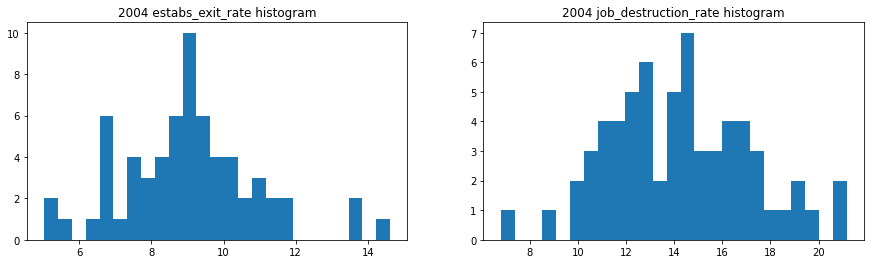

In [11]:
# [Before] 2004

# Plotting the histogram
figure, axis = plt.subplots(1,2, figsize=(15,4))

A1 = bdsEstabs2004['estabs_exit_rate']
A2 = bdsEstabs2004['job_destruction_rate']

# For estabs_exit_rate
axis[0].hist(A1, bins=25)
axis[0].set_title('2004 estabs_exit_rate histogram')

# For job_destruction_rate
axis[1].hist(A2, bins=25)
axis[1].set_title('2004 job_destruction_rate histogram')

**After the Hurricane**

In [12]:
# [After] 2006 Descriptive statistics
bdsEstabs2006 = bdsEstabs[bdsEstabs.year == 2006]
bdsEstabs2006[['estabs_exit_rate', 'job_destruction_rate']].describe()

,estabs_exit_rate,job_destruction_rate
count,64.000000,64.000000
mean,11.704906,16.056828
std,10.617232,12.233945
min,5.744000,3.698000
25%,8.531500,10.595500
50%,9.292500,13.188500
75%,10.837750,16.287500
max,84.706000,91.481000


Text(0.5, 1.0, '2006 job_destruction_rate histogram')

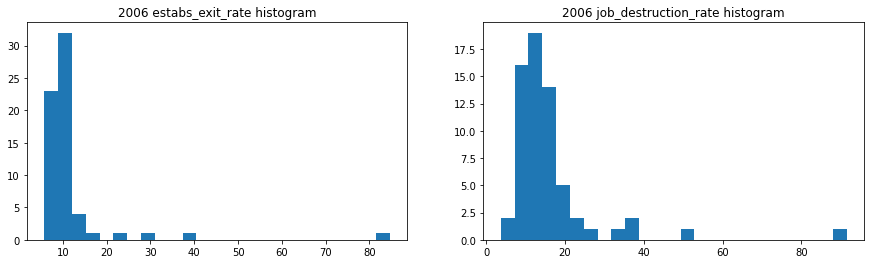

In [13]:
# [After] 2006

# Plotting the histogram
figure, axis = plt.subplots(1,2, figsize=(15,4))

B1 = bdsEstabs2006['estabs_exit_rate']
B2 = bdsEstabs2006['job_destruction_rate']

# For estabs_exit_rate
axis[0].hist(B1, bins=25)
axis[0].set_title('2006 estabs_exit_rate histogram')

# For job_destruction_rate
axis[1].hist(B2, bins=25)
axis[1].set_title('2006 job_destruction_rate histogram')

The business exits and job destruction rates are normally distributed before the Hurricane with a 9% and 14% average, respectively. On the other hand, the business exit and job destruction rates in Louisiana are positively skewed with a long tail towards the right end of the histogram.

The positively skewed histogram displays a large disparity between the counties of Louisiana after the Hurricane. A disparity in business exits and job destruction rate after the disaster signifies that some counties suffers from the disaster, while some others are not. The Author will investigate this disparity between the counties using a geographic heatmap to visualise the damage done by the Hurricane.

## Heatmap Analysis

Illustrating the difference between counties before and after the disaster, the Author will display a geographic heatmap by matching the county codes using GIS data with STATA. GIS data for the following map are taken from the [USGS National Boundary Dataset](http://sciencebase.gov/catalog/item/59fa9f5de4b0531197affb35), which is available as a shape (.shp) file (*GU_CountyOfEquivalent.shp*, renamed to *louisiana.shp* in the [Author's GitHub](https://github.com/christian-swjy/hurricaneKatrina)).

To analyse the data with STATA using python, the data analyst will need to install the stata_setup library with `pip install --upgrade --user stata_setup` command as provided by the [pystata documentation](https://www.stata.com/python/pystata18/notebook/Quick%20Start0.html). However, running this program requires one to own an original STATA 17 license.

In [14]:
# Importing the stata_setup library
import stata_setup
stata_setup.config("C:/Program Files/Stata17/", "mp")
from pystata import stata


  ___  ____  ____  ____  ____ ®
 /__    /   ____/   /   ____/      17.0
___/   /   /___/   /   /___/       MP—Parallel Edition

 Statistics and Data Science       Copyright 1985-2021 StataCorp LLC
                                   StataCorp
                                   4905 Lakeway Drive
                                   College Station, Texas 77845 USA
                                   800-STATA-PC        https://www.stata.com
                                   979-696-4600        stata@stata.com

Stata license: Unlimited-user 2-core network, expiring 23 Jul 2023
Serial number: 501709308940
  Licensed to: Christian Siauwijaya
               University of Glasgow

Notes:
      1. Unicode is supported; see help unicode_advice.
      2. More than 2 billion observations are allowed; see help obs_advice.
      3. Maximum number of variables is set to 5,000 but can be increased;
          see help set_maxvar.


***Convert the shp data to dta***

In [15]:
%%stata
spshape2dta louisiana, replace

  (importing .shp file)
  (importing .dbf file)
  (creating _ID spatial-unit id)
  (creating _CX coordinate)
  (creating _CY coordinate)

  file louisiana_shp.dta created
  file louisiana.dta     created


***Prepare the shape data for merger with the bdsEstabs2004 and bdsEstabs2006 dataframe***

In [16]:
%%stata
use louisiana, clear
rename county_fip cty
destring cty, replace
rename state_fips st
destring st, replace
tab cty
save louisiana, replace


. use louisiana, clear

. rename county_fip cty

. destring cty, replace
cty: all characters numeric; replaced as int

. rename state_fips st

. destring st, replace
st: all characters numeric; replaced as byte

. tab cty

 county_fip |      Freq.     Percent        Cum.
------------+-----------------------------------
          1 |          1        1.56        1.56
          3 |          1        1.56        3.13
          5 |          1        1.56        4.69
          7 |          1        1.56        6.25
          9 |          1        1.56        7.81
         11 |          1        1.56        9.38
         13 |          1        1.56       10.94
         15 |          1        1.56       12.50
         17 |          1        1.56       14.06
         19 |          1        1.56       15.63
         21 |          1        1.56       17.19
         23 |          1        1.56       18.75
         25 |          1        1.56       20.31
         27 |          1        1.56     

In [17]:
# Export the bdsEstabs2004 and bdsEstabs2006 to stata
bdsEstabs2004.to_stata('bdsEstabs2004.dta')
bdsEstabs2006.to_stata('bdsEstabs2006.dta')

According to the [codebook](https://www.census.gov/content/dam/Census/programs-surveys/business-dynamics-statistics/codebook-glossary.pdf), the state and county number codes follows a [coding system](https://www2.census.gov/programs-surveys/cbp/technical-documentation/reference/state-county-geography-reference/georef17.txt) similar to the FIPS used by the [USGS National Boundary Dataset](sciencebase.gov/catalog/item/59fa9f5de4b0531197affb35). Knowing this information, the Author will merge the *bdsEstabs2004* and *bdsEstabs2006* dataset with the shp file using FIPS county codes as key.

***Merge the bdsEstabs2004 dataset with the shape file***

In [52]:
%%stata
use bdsEstabs2004, clear
merge 1:1 cty using louisiana
save bdsEstabs2004_merged, replace


. use bdsEstabs2004, clear

. merge 1:1 cty using louisiana

    Result                      Number of obs
    -----------------------------------------
    Not matched                             0
    Matched                                64  (_merge==3)
    -----------------------------------------

. save bdsEstabs2004_merged, replace
file bdsEstabs2004_merged.dta saved

. 


***Display the 2004 business establishment exit rate in Louisiana on a geographical heatmap***

In [56]:
%%stata
grmap estabs_exit_rate, clnumber(5) clmethod(quantile) legtitle("Exit Rate")
graph export Louisiana_exitRate2004.jpg, as(jpg) replace


. grmap estabs_exit_rate, clnumber(5) clmethod(quantile) legtitle("Exit Rate")

. graph export Louisiana_exitRate2004.jpg, as(jpg) replace
file Louisiana_exitRate2004.jpg written in JPEG format

. 


| ![New Orleans 2004 Business Exit Rate BEFORE Hurricane](Louisiana_exitRate2004.jpg) | 
|:--:| 
| Figure 4. New Orleans 2004 Business Exit Rate (**Before the Hurricane**) |

***Display the 2004 job destruction rate in Louisiana on a geographical heatmap***

In [20]:
%%stata
grmap job_destruction_rate, clnumber(5) clmethod(quantile) legtitle("Exit Rate")
quietly graph export Louisiana_jobDestructRate2004.jpg, as(jpg) replace


. grmap job_destruction_rate, clnumber(5) clmethod(quantile) legtitle("Exit Rat
> e")

. graph export Louisiana_jobDestructRate2004.jpg, as(jpg) replace
(file Louisiana_jobDestructRate2004.jpg not found)
file Louisiana_jobDestructRate2004.jpg written in JPEG format

. 


| ![New Orleans 2004 job destruction Rate BEFORE Hurricane](Louisiana_jobDestructRate2004.jpg) | 
|:--:| 
| Figure 5. New Orleans 2004 job destruction Rate (**Before the Hurricane**) |

Following the same method, the 2006 business establishment exit rate will be displayed on a geographical heatmap using STATA.

***Merge the bdsEstabs2006 dataset with the shape file***

In [21]:
%%stata
use bdsEstabs2006, clear
merge 1:1 cty using louisiana
save bdsEstabs2006_merged, replace


. use bdsEstabs2006, clear

. merge 1:1 cty using louisiana

    Result                      Number of obs
    -----------------------------------------
    Not matched                             0
    Matched                                64  (_merge==3)
    -----------------------------------------

. save bdsEstabs2006_merged, replace
file bdsEstabs2006_merged.dta saved

. 


***Display the 2006 business establishment exit rate in Louisiana on a geographical heatmap***

In [22]:
%%stata
grmap estabs_exit_rate, clnumber(5) clmethod(quantile) legtitle("Exit Rate")
quietly graph export Louisiana_exitRate2006.jpg, as(jpg) replace


. grmap estabs_exit_rate, clnumber(5) clmethod(quantile) legtitle("Exit Rate")

. graph export Louisiana_exitRate2006.jpg, as(jpg) replace
file Louisiana_exitRate2006.jpg written in JPEG format

. 


| ![New Orleans 2006 Business Exit Rate AFTER the Hurricane](Louisiana_exitRate2006.jpg) | 
|:--:| 
| Figure 6. New Orleans 2006 Business Exit Rate (**After the Hurricane**) |

***Display the 2006 job destruction rate in Louisiana on a geographical heatmap***

In [23]:
%%stata
grmap job_destruction_rate, clnumber(5) clmethod(quantile) legtitle("Exit Rate")
graph export Louisiana_jobDestructRate2006.jpg, as(jpg) replace


. grmap job_destruction_rate, clnumber(5) clmethod(quantile) legtitle("Exit Rat
> e")

. graph export Louisiana_jobDestructRate2006.jpg, as(jpg) replace
(file Louisiana_jobDestructRate2006.jpg not found)
file Louisiana_jobDestructRate2006.jpg written in JPEG format

. 


| ![New Orleans 2006 job destruction Rate AFTER the Hurricane](Louisiana_jobDestructRate2006.jpg) | 
|:--:| 
| Figure 7. New Orleans 2006 job destruction Rate (**After the Hurricane**) |

The figures above show clear difference between the exit rate of businesses and job destruction before and after the Hurricane. The geographic heatmap analysis confirms the hypothesis that disparity between coastal and non-coastal counties exist after the disaster. However, comparing two timeframes alone would not be sufficient to understand the long-term effect of being hit by a destructive hurricane. Therefore, the difference-in-difference regression (DID) technique will be used to compare the coastal and non-coastal counties as they are prone from being affected the by the hurricane.

| ![Louisiana Counties and FIPS code](LouisianaCounties.jpg "weather.gov/pimar/FIPSCodes") | 
|:--:| 
| Figure 8. Louisiana Counties and FIPS code (Source: [weather.gov](weather.gov/pimar/FIPSCodes), edited by the Author|

## Difference-in-Difference Analysis

In [24]:
# Exporting the full and unrestricted bdsEstabs dataframe to STATA
bdsEstabs.to_stata('bdsEstabs.dta')

In [58]:
%%stata
use bdsEstabs, clear

**Setting the STATA panel dataset**
xtset cty year

**Mark the years past Hurricane Katrina**
gen postKatrina = year>2005


. use bdsEstabs, clear

. 
. **Setting the STATA panel dataset**
. xtset cty year

Panel variable: cty (strongly balanced)
 Time variable: year, 1978 to 2020
         Delta: 1 unit

. 
. **Mark the years past Hurricane Katrina**
. gen postKatrina = year>2005

. 


### Coastal Counties Model

[Wave Forecasting Model](https://sos.noaa.gov/catalog/datasets/wave-heights-hurricane-katrina-2005/) done by the NOAA in 2014 show that Hurricane Katrina was able to create devastating waves as high as 15.4m (50.5ft). Two sea buoys capsized and sea levees in coastal Louisiana was breached due to destructive powers of the waves. The city of New Orleans was hit the worst with 80% of the city and its surrounding area remain flooded after the hurricane. The city of New Orleans suffered because most of the city was already [below sea level](https://earthobservatory.nasa.gov/images/15445/hurricane-katrina-floods-new-orleans). However, effects of the hurricane on business dynamics remains unclear when comparing all of the coastal counties with those located inland. Investigating the effects of Hurricane Katrina, the Author will perform a DID analysis by exploiting the *cty* geocodes to compare the business exits and job destruction rates in coastal and non-coastal counties.

Referring to Figure 8 above, the Author selects 14 counties directly bordering the Gulf of Mexico and name them as the 'treatment' group. Those 14 counties are: Cameron(23), Vermilion(13), Iberia(45), St Mary(101), Terrebonne(109), Lafourche(57), Jefferson(51), Plaquemines(75), St Bernard(87), Orleans(71), St Charles(89), St John the Baptist(95), Tangipahoa(105), and St Tammany(103).

***Making a new variable to group all counties listed above***

In [59]:
%%stata
egen coastal = anymatch(cty), values(23 13 45 101 109 57 51 75 87 71 89 95 105 103)

***Making an interaction variable between the coastal counties and the postKatrina period***

In [60]:
%%stata
gen coastalKatrina = coastal*postKatrina

***Difference-in-difference regression comparing coastal and non-coastal counties***

In [61]:
%%stata
xtdidregress (estabs_exit_rate) (coastalKatrina), group(cty) time(year)


Number of groups and treatment time

Time variable: year
Control:       coastalKatrina = 0
Treatment:     coastalKatrina = 1
-----------------------------------
             |   Control  Treatment
-------------+---------------------
Group        |
         cty |        50         14
-------------+---------------------
Time         |
     Minimum |      1978       2006
     Maximum |      1978       2006
-----------------------------------

Difference-in-differences regression                     Number of obs = 2,752
Data type: Longitudinal

                                   (Std. err. adjusted for 64 clusters in cty)
------------------------------------------------------------------------------
             |               Robust
estabs_exi~e | Coefficient  std. err.      t    P>|t|     [95% conf. interval]
-------------+----------------------------------------------------------------
ATET         |
coastalKat~a |
   (1 vs 0)  |   1.096505   .5041132     2.18   0.033     .0891149   


. estat trendplots, ltrends(ytitle(Exit Rate) title(Hurricane Katrina's effect 
> on business exit rate (Coastal))) xlabel(1978(2)2020)

. graph export businessExit_coastalModel.jpg, as(jpg) replace
file businessExit_coastalModel.jpg written in JPEG format

. 


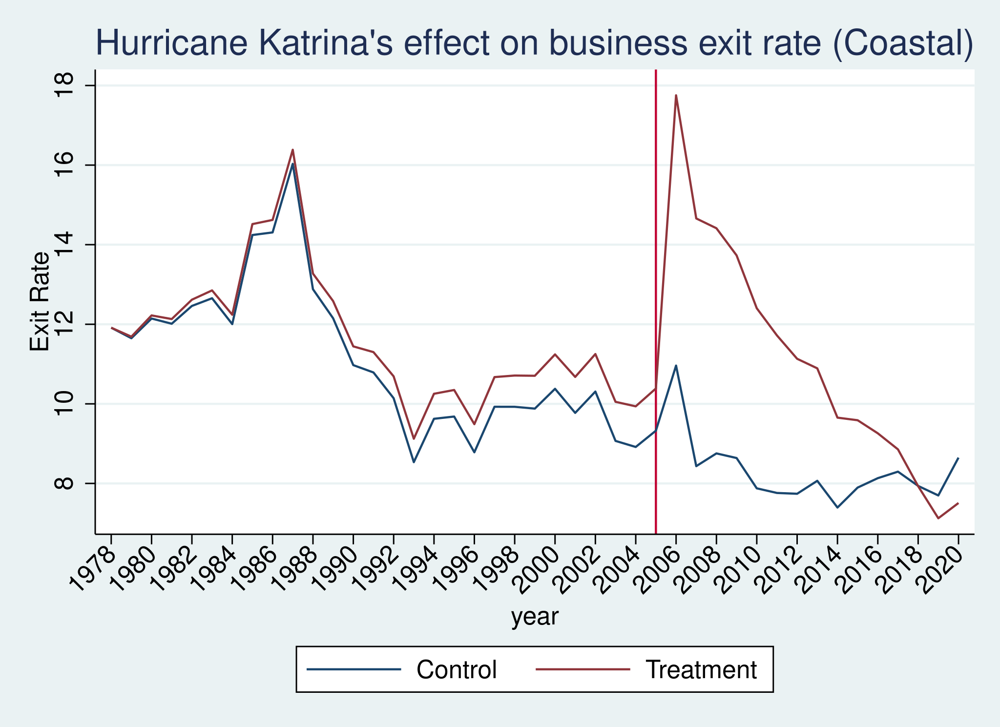

In [49]:
%%stata
estat trendplots, ltrends(ytitle(Exit Rate) title(Hurricane Katrina's effect on business exit rate (Coastal))) xlabel(1978(2)2020)
graph export businessExit_coastalModel.jpg, as(jpg) replace

| ![Business exit rate (coastal)](businessExit_coastalModel.jpg) | 
|:--:| 
| Figure 9. Hurricane Katrina's effect on business exit rate (Coastal)|

In [62]:
%%stata
xtdidregress (job_destruction_rate) (coastalKatrina), group(cty) time(year)


Number of groups and treatment time

Time variable: year
Control:       coastalKatrina = 0
Treatment:     coastalKatrina = 1
-----------------------------------
             |   Control  Treatment
-------------+---------------------
Group        |
         cty |        50         14
-------------+---------------------
Time         |
     Minimum |      1978       2006
     Maximum |      1978       2006
-----------------------------------

Difference-in-differences regression                     Number of obs = 2,752
Data type: Longitudinal

                                   (Std. err. adjusted for 64 clusters in cty)
------------------------------------------------------------------------------
             |               Robust
job_destru~e | Coefficient  std. err.      t    P>|t|     [95% conf. interval]
-------------+----------------------------------------------------------------
ATET         |
coastalKat~a |
   (1 vs 0)  |   .6905174   .6301215     1.10   0.277    -.5686799   


. estat trendplots, ltrends(ytitle(Exit Rate) title(Hurricane Katrina's effect 
> on job destruction rate (Coastal))) xlabel(1978(2)2020)

. graph export jobDestruct_coastalModel.jpg, as(jpg) replace
(file jobDestruct_coastalModel.jpg not found)
file jobDestruct_coastalModel.jpg written in JPEG format

. 


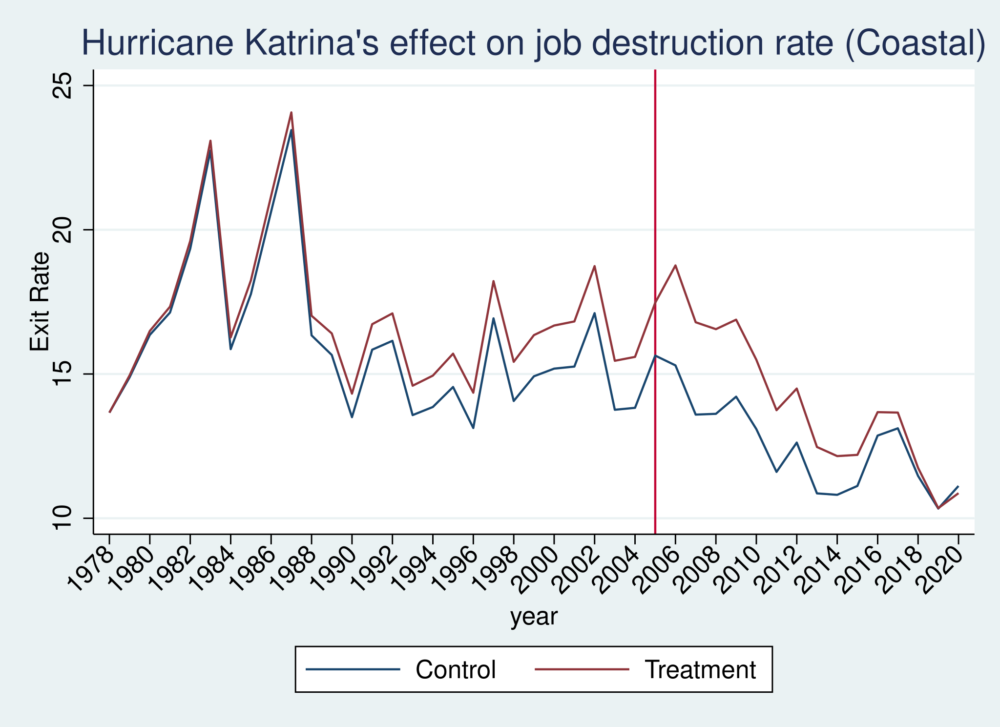

In [63]:
%%stata
estat trendplots, ltrends(ytitle(Exit Rate) title(Hurricane Katrina's effect on job destruction rate (Coastal))) xlabel(1978(2)2020)
graph export jobDestruct_coastalModel.jpg, as(jpg) replace

| ![job destruction rate (coastal)](jobDestruct_coastalModel.jpg) | 
|:--:| 
| Figure 9. Hurricane Katrina's effect on job destruction rate (Coastal)|

The DID analysis show that businesses located in coastal counties are significantly affected by the Hurricane as shown by stark difference between the treatment (maroon line) with the control (blue line). The regression result show that the exit rate of businesses in coastal and non-coastal counties are alike before being disturbed by Hurricane Katrina, which increased the destruction of businesses and jobs in the coastal counties of Louisiana. Destruction from the hurricane led to an increase in business exit rate of coastal counties, which led to a 10 year recovery period. Similarly, The same effect was also observed for job destruction rate in coastal counties of Louisiana, confirming the hypothesis that businesses located in coastal counties of Louisiana suffers when compared to those inland.

### Selected Counties Model

Refering to Figure 4, the author selects 7 counties damaged by Hurricane Katrina the most based on the *bdsEstabs2006* STATA figure and Hurricane Katrina's path shown in Figure 2 above. Those 7 counties are: Plaquemines(75), St Bernard(87), Orleans(71), St Charles(89), Jefferson(51), St Tammany(103), and Washington(117).

***Making a new variable to group all counties listed above***

In [65]:
%%stata
egen damaged = anymatch(cty), values(75 87 71 89 51 103 117)

***Making an interaction variable between counties damaged by hurricane katrina and the postKatrina period***

In [66]:
%%stata
gen damagedKatrina = damaged*postKatrina

***Difference-in-difference regression comparing counties hit by the hurricane with the other counties***

In [67]:
%%stata
xtdidregress (estabs_exit_rate) (damagedKatrina), group(cty) time(year)


Number of groups and treatment time

Time variable: year
Control:       damagedKatrina = 0
Treatment:     damagedKatrina = 1
-----------------------------------
             |   Control  Treatment
-------------+---------------------
Group        |
         cty |        57          7
-------------+---------------------
Time         |
     Minimum |      1978       2006
     Maximum |      1978       2006
-----------------------------------

Difference-in-differences regression                     Number of obs = 2,752
Data type: Longitudinal

                                   (Std. err. adjusted for 64 clusters in cty)
------------------------------------------------------------------------------
             |               Robust
estabs_exi~e | Coefficient  std. err.      t    P>|t|     [95% conf. interval]
-------------+----------------------------------------------------------------
ATET         |
damagedKat~a |
   (1 vs 0)  |   2.295589   .7308416     3.14   0.003     .8351184   


. estat trendplots, ltrends(ytitle(Exit Rate) title(Hurricane Katrina's effect 
> on business exit rate (Selected))) xlabel(1978(2)2020)

. graph export businessExit_selectedModel.jpg, as(jpg) replace
(file businessExit_selectedModel.jpg not found)
file businessExit_selectedModel.jpg written in JPEG format

. 


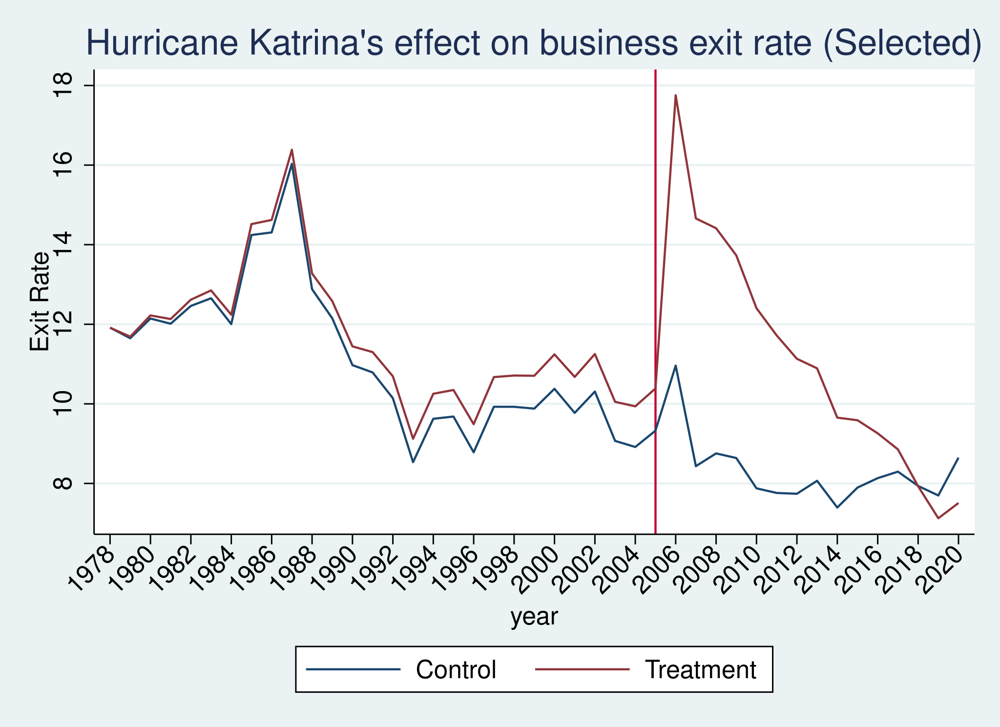

In [68]:
%%stata
estat trendplots, ltrends(ytitle(Exit Rate) title(Hurricane Katrina's effect on business exit rate (Selected))) xlabel(1978(2)2020)
graph export businessExit_selectedModel.jpg, as(jpg) replace

| ![business exit rate (selected)](businessExit_selectedModel.jpg) | 
|:--:| 
| Figure 10. Hurricane Katrina's effect on business exit rate (Selected)|

In [70]:
%%stata
xtdidregress (estabs_exit_rate) (damagedKatrina), group(cty) time(year)


Number of groups and treatment time

Time variable: year
Control:       damagedKatrina = 0
Treatment:     damagedKatrina = 1
-----------------------------------
             |   Control  Treatment
-------------+---------------------
Group        |
         cty |        57          7
-------------+---------------------
Time         |
     Minimum |      1978       2006
     Maximum |      1978       2006
-----------------------------------

Difference-in-differences regression                     Number of obs = 2,752
Data type: Longitudinal

                                   (Std. err. adjusted for 64 clusters in cty)
------------------------------------------------------------------------------
             |               Robust
estabs_exi~e | Coefficient  std. err.      t    P>|t|     [95% conf. interval]
-------------+----------------------------------------------------------------
ATET         |
damagedKat~a |
   (1 vs 0)  |   2.295589   .7308416     3.14   0.003     .8351184   


. estat trendplots, ltrends(ytitle(Exit Rate) title(Hurricane Katrina's effect 
> on job destruction rate (Selected))) xlabel(1978(2)2020)

. graph export jobDestruct_selectedModel.jpg, as(jpg) replace
(file jobDestruct_selectedModel.jpg not found)
file jobDestruct_selectedModel.jpg written in JPEG format

. 


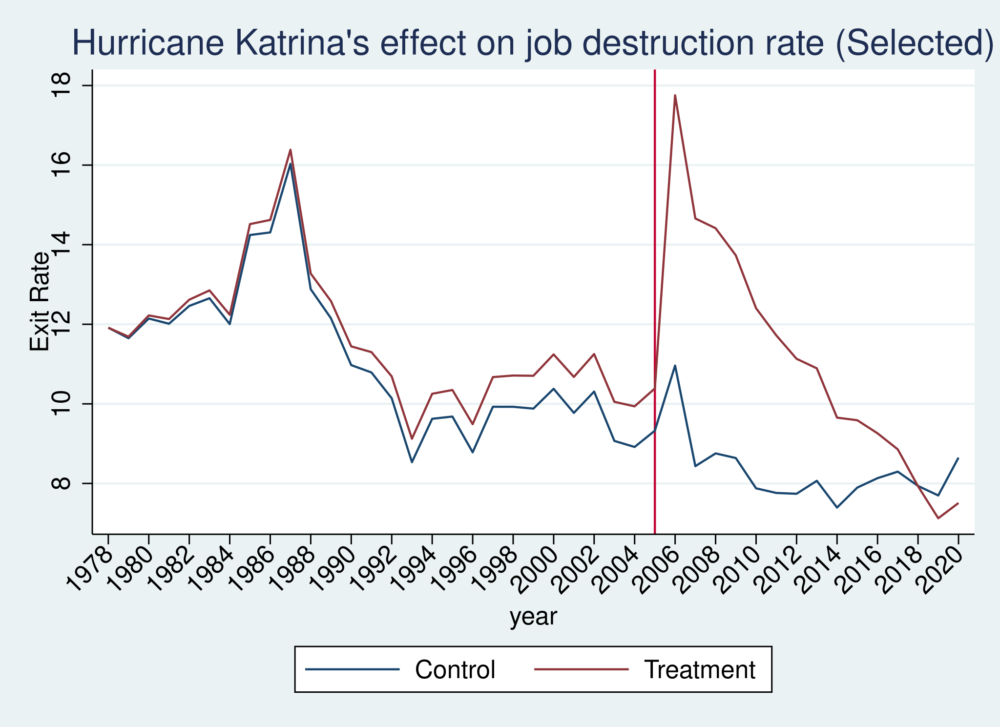

In [71]:
%%stata
estat trendplots, ltrends(ytitle(Exit Rate) title(Hurricane Katrina's effect on job destruction rate (Selected))) xlabel(1978(2)2020)
graph export jobDestruct_selectedModel.jpg, as(jpg) replace

| ![job destruction rate (selected)](jobDestruct_selectedModel.jpg) | 
|:--:| 
| Figure 11. Hurricane Katrina's effect on job destruction rate (Selected))|

Treatment (maroon line) denotes the exit rate of businesses in the counties heavily damaged by Hurricane Katrina, while control (blue line) denotes other counties that are not heavily damaged. The difference-in-difference analysis show a **significant** difference between the control and treatment after the hurricane with **99% statistical confidence**, which illustrate the detrimental effect on businesses after the hurricane. The same figure also show that business exit rate in the heavily damaged counties are 2% higher after the Hurricane, which only recovers 10 years after the disaster.

## Conclusion

All in all, the impact of Hurricane Katrina on businesses in Louisiana was detrimental. The storm's destructive force destroyed businesses in counties passed by the the Hurricane, which led to an increased rate of permanent closures after the disaster. Widespread economic distruption dealt by the hurricane affects businesses located near the Gulf of Mexico, exposing vulnerabilities of businesses in hurricane prone areas. Despite the resilience of Louisiana's business community, extensive damage dealt by the Hurricane made recovery prolonged in counties heavily damaged by the storm along with those near the coast. Hurricance Katrina in 2005 left a deep scar for the business dynamics in Louisiana due to an increased exit rate in coastal counties, which are previously comparable. The lessons learned from this catastrophic event continues lend us the knowledge of how a catasrophic event can affect the recovery of businesses and efforts aimed towards creating a more resilient business environment in the face of future disasters.

---

In [36]:
# to do: Edit and add more interpretation for the selected counties and coastal counties model.

----